# Lab Assignment 10: Exploratory Data Analysis, Part 1
## DS 6001: Practice and Application of Data Science
### Robert Clay Harris jbm2rt

### Instructions
Please answer the following questions as completely as possible using text, code, and the results of code as needed. Format your answers in a Jupyter notebook. To receive full credit, make sure you address every part of the problem, and make sure your document is formatted in a clean and professional way.

In this lab, you will be working with the 2018 [General Social Survey (GSS)](http://www.gss.norc.org/). The GSS is a sociological survey created and regularly collected since 1972 by the National Opinion Research Center at the University of Chicago. It is funded by the National Science Foundation. The GSS collects information and keeps a historical record of the concerns, experiences, attitudes, and practices of residents of the United States, and it is one of the most important data sources for the social sciences. 

The data includes features that measure concepts that are notoriously difficult to ask about directly, such as religion, racism, and sexism. The data also include many different metrics of how successful a person is in his or her profession, including income, socioeconomic status, and occupational prestige. These occupational prestige scores are coded separately by the GSS.  The full description of their methodology for measuring prestige is available here: http://gss.norc.org/Documents/reports/methodological-reports/MR122%20Occupational%20Prestige.pdf Here's a quote to give you an idea about how these scores are calculated:

> Respondents then were given small cards which each had a single occupational titles listed on it. Cards were in English or Spanish. They were given one card at a time in the preordained order. The interviewer then asked the respondent to "please put the card in the box at the top of the ladder if you think that occupation has the highest possible social standing. Put it in the box of the bottom of the ladder if you think it has the lowest possible social standing. If it belongs somewhere in between, just put it in the box that matches the social standing of the occupation."

The prestige scores are calculated from the aggregated rankings according to the method described above.

### Problem 0
Import the following packages:

In [24]:
import IPython.display as ip_display
import sys
sys.modules["IPython.core.display"].display = ip_display.display
%matplotlib inline

In [5]:
import numpy as np
import pandas as pd
import sidetable
import weighted # this is a module of wquantiles, so type pip install wquantiles or conda install wquantiles to get access to it
from scipy import stats 
from sklearn import manifold
from sklearn import metrics
import prince
from ydata_profiling import ProfileReport
pd.options.display.max_columns = None

Then load the GSS data with the following code:

In [6]:
%%capture
gss = pd.read_csv("https://github.com/jkropko/DS-6001/raw/master/localdata/gss2018.csv",
                 encoding='cp1252', na_values=['IAP','IAP,DK,NA,uncodeable', 'NOT SURE',
                                               'DK', 'IAP, DK, NA, uncodeable', '.a', "CAN'T CHOOSE"])

### Problem 1
Drop all columns except for the following:
* `id` - a numeric unique ID for each person who responded to the survey
* `wtss` - survey sample weights
* `sex` - male or female
* `educ` - years of formal education
* `region` - region of the country where the respondent lives
* `age` - age
* `coninc` - the respondent's personal annual income
* `prestg10` - the respondent's occupational prestige score, as measured by the GSS using the methodology described above
* `mapres10` - the respondent's mother's occupational prestige score, as measured by the GSS using the methodology described above
* `papres10` -the respondent's father's occupational prestige score, as measured by the GSS using the methodology described above
* `sei10` - an index measuring the respondent's socioeconomic status
* `satjob` - responses to "On the whole, how satisfied are you with the work you do?"
* `fechld` - agree or disagree with: "A working mother can establish just as warm and secure a relationship with her children as a mother who does not work."
* `fefam` - agree or disagree with: "It is much better for everyone involved if the man is the achiever outside the home and the woman takes care of the home and family."
* `fepol` - agree or disagree with: "Most men are better suited emotionally for politics than are most women."
* `fepresch` - agree or disagree with: "A preschool child is likely to suffer if his or her mother works."
* `meovrwrk` - agree or disagree with: "Family life often suffers because men concentrate too much on their work."

Then rename any columns with names that are non-intuitive to you to more intuitive and descriptive ones. Finally, replace the "89 or older" values of `age` with 89, and convert `age` to a float data type. [1 point]

In [7]:
columns_to_keep = [
    'id', 'wtss', 'sex', 'educ', 'region', 'age', 'coninc', 
    'prestg10', 'mapres10', 'papres10', 'sei10', 'satjob', 
    'fechld', 'fefam', 'fepol', 'fepresch', 'meovrwrk'
]
gss = gss[columns_to_keep]

gss.rename(columns={
    'wtss': 'weight', 
    'educ': 'education_years', 
    'coninc': 'income', 
    'prestg10': 'occupation_prestige', 
    'mapres10': 'mother_occupation_prestige', 
    'papres10': 'father_occupation_prestige', 
    'sei10': 'socioeconomic_index', 
    'satjob': 'job_satisfaction', 
    'fechld': 'working_mother_relationship', 
    'fefam': 'traditional_gender_roles', 
    'fepol': 'men_better_politics', 
    'fepresch': 'preschool_mother_working', 
    'meovrwrk': 'family_suffers_men_work'
}, inplace=True)

gss['age'] = gss['age'].replace('89 or older', 89).astype(float)

gss.head(3).T

,0,1,2
id,1,2,3
weight,2.357493,0.942997,0.942997
sex,male,female,male
education_years,14.0,10.0,16.0
region,new england,new england,new england
age,43.0,74.0,42.0
income,NaN,22782.5,112160.0
occupation_prestige,47.0,22.0,61.0
mother_occupation_prestige,31.0,32.0,32.0
father_occupation_prestige,45.0,39.0,72.0


### Problem 2
#### Part a
Use the `ProfileReport()` function to generate and embed an HTML formatted exploratory data analysis report in your notebook. Make sure that it includes a "Correlations" report along with "Overview" and "Variables". [1 point]

In [ ]:
profile = ProfileReport(gss,
                        title = "2018 General Social Survey (GSS)",
                        html = {"style": {"full_width": True}},
                        minimal = False,
                        correlations={"auto": {"calculate": True},
                                      "pearson": {"calculate": True},
                                      "spearman": {"calculate": True},
                                      "kendall": {"calculate": True},
                                      "phi_k": {"calculate": True},
                                      "cramers": {"calculate": True}},)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/opt/anaconda3/lib/python3.12/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  datahist = data_binned.groupby([c0, c1])[c0].count().to_frame().unstack().fillna(0)
/opt/anaconda3/lib/python3.12/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  datahist = data_binned.groupby([c0, c1])[c0].count().to_frame().unstack().fillna(0)
/opt/anaconda3/lib/python3.12/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or ob

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Part b
Looking through the HTML report you displayed in part a, how many people in the data are from New England? [1 point]

124

#### Part c
Looking through the HTML report you displayed in part a, which feature in the data has the highest number of missing values, and what percent of the values are missing for this feature? [1 point]

`men_better_politics` (originally `fepol`) has the highest number of missing values, 849, which is 34.2% of the values.

#### Part d
Looking through the HTML report you displayed in part a, which two distinct features in the data have the highest correlation? [1 point]

`occupation_prestige` and `socioeconomic_index` have the highest correlation, 0.849.

### Problem 3
On a primetime show on a 24-hour cable news network, two unpleasant-looking men in suits sit across a table from each other, scowling. One says "This economy is failing the middle-class. The average American today is making less than \\$48,000 a year." The other screams "Fake news! The typical American makes more than \$55,000 a year!" Explain, using words and code, how the data can support both of their arguments. Use the sample weights to calculate descriptive statistics that are more representative of the American adult population as a whole. [1 point]

Income data are often skewed by a relatively small number of very high incomes. As a result, the arithmetic mean is very sensitive to extreme values and might be pulled in one direction, while the median remains robust to such extremes.

In this scenario, one pundit claims that “the average American today is making less than $48,000 a year.” He may be referring to the median income. The other, by saying “the typical American makes more than $55,000 a year,” may be referring to the mean. When we calculate these statistics using the sample weights in the survey data (which adjust the raw sample to be more representative of the full American adult population), we might find that the weighted mean and the weighted median differ enough to support both claims. For example, we can check if the weighted median comes out to be around $47,500 (supporting the first claim) and if the weighted mean is around $55,200 (supporting the second).

In [ ]:
gss_clean = gss.dropna(subset=['income', 'weight'])

weighted_mean_income = np.average(gss_clean['income'], weights=gss_clean['weight'])
print("Weighted Mean Income: ${:,.2f}".format(weighted_mean_income))

weighted_median_income = weighted.median(gss_clean['income'], weights=gss_clean['weight'])
print("Weighted Median Income: ${:,.2f}".format(weighted_median_income))

Weighted Mean Income: $55,158.96
Weighted Median Income: $47,317.50


Indeed, this is what we see in the data.

### Problem 4
For each of the following parts, 
* generate a table that provides evidence about the relationship between the two features in the data that are relevant to each question, 
* interpret the table in words, 
* use a hypothesis test to assess the strength of the evidence in the table, 
* and provide a **specific and accurate** intepretation of the $p$-value associated with this hypothesis test beyond "significant or not". 

#### Part a
Is there a gender wage gap? That is, is there a difference between the average incomes of men and women? [2 points]

In [10]:
income_by_sex = gss.groupby('sex')['income'].agg(['count', 'mean', 'std']).reset_index()
income_by_sex

,sex,count,mean,std
0,female,1174,47191.021452,41637.984972
1,male,978,53314.626187,43097.028533


The table shows that the mean income for men is $53,315 with a standard deviation of $43,097 while for women the mean is $47,191 with a standard deviation of $41638. This preliminary evidence suggests that there might be a difference between the groups.

We use a two-sample t-test to assess whether the difference in sample means is large enough that it is unlikely to have occurred under the null hypothesis of no true difference.

Null Hypothesis: The true mean income for men equals the true mean income for women.

Alternative Hypothesis: The true mean incomes are different.

In [11]:
income_male = gss.loc[gss['sex'] == 'male', 'income'].dropna()
income_female = gss.loc[gss['sex'] == 'female', 'income'].dropna()

stats.ttest_ind(income_male, income_female, equal_var=False, nan_policy='omit')

TtestResult(statistic=3.332824087618215, pvalue=0.000874955788153009, df=2053.1579577339658)

The p-value represents the probability of obtaining a difference in sample means as extreme as (or more extreme than) the one observed, assuming that the null hypothesis is true. Since the p-value is 0.00087, there is a 0.087% chance of observing such a difference if in reality there was no difference between men's and women's average incomes. Since this p-value is below the common alpha level of 0.05, we would reject the null hypothesis and conclude that there is statistically significant evidence of a gender wage gap. This means that the data suggest a real difference in average incomes between men and women—supporting the idea that a gender wage gap exists.

#### Part b
Are there different average values of occupational prestige for different levels of job satisfaction? [2 points]

In [12]:
prestige_by_job_sat = gss.groupby('job_satisfaction')['occupation_prestige'] \
                         .agg(['count', 'mean', 'std']) \
                         .reset_index()
prestige_by_job_sat

,job_satisfaction,count,mean,std
0,a little dissat,168,40.946429,12.904652
1,mod. satisfied,639,42.589984,13.415857
2,very dissatisfied,62,43.000000,14.193048
3,very satisfied,824,46.189320,13.857391


The table shows that respondents who are "very satisfied" with their jobs have, on average, a higher occupational prestige (mean = 46.19) compared to those in the other categories—"a little dissatisfied" (40.95), "mod. satisfied" (42.59), or "very dissatisfied" (43.00). This suggests there might be a positive relationship between job satisfaction and occupational prestige: higher reported satisfaction is associated with a higher average prestige score.

Because job satisfaction is a categorical variable with more than two levels and occupational prestige is continuous, we use a one-way ANOVA. Here, we test:

Null Hypothesis: The mean occupational prestige is the same for all levels of job satisfaction.

Alternative Hypothesis: At least one job satisfaction level has a mean occupational prestige that is different.

In [13]:
gss_anova = gss.dropna(subset=['job_satisfaction', 'occupation_prestige'])

groups = gss_anova.groupby('job_satisfaction')['occupation_prestige'].apply(list)

stats.f_oneway(*groups)

F_onewayResult(statistic=12.205403153509732, pvalue=6.67668642502983e-08)

The one-way ANOVA comparing occupational prestige across job satisfaction levels yielded an F-statistic of approximately 12.21 with a p-value of about \(6.68 \times 10^{-8}\). This p-value means that if there were truly no differences in mean occupational prestige among the job satisfaction groups, there would be only a \(6.68 \times 10^{-8}\) (or 0.0000000668%) chance of observing such extreme differences simply by chance. This extremely low probability leads us to conclude, with very high confidence, that the mean occupational prestige differs significantly among the different levels of job satisfaction.

### Problem 5
Report the Pearson's correlation between years of education, socioeconomic status, income, occupational prestige, and a person's mother's and father's occupational prestige? Then perform a hypothesis test for the correlation between years of education and socioeconomic status and provide a **specific and accurate** intepretation of the $p$-value associated with this hypothesis test beyond "significant or not". [2 points]

In [14]:
cols = [
    'education_years', 
    'socioeconomic_index', 
    'income', 
    'occupation_prestige', 
    'mother_occupation_prestige', 
    'father_occupation_prestige'
]

corr_matrix = gss[cols].corr(method='pearson')
corr_matrix

,education_years,socioeconomic_index,income,occupation_prestige,mother_occupation_prestige,father_occupation_prestige
education_years,1.000000,0.558169,0.389245,0.479933,0.269115,0.261417
socioeconomic_index,0.558169,1.000000,0.417210,0.835515,0.203486,0.210451
income,0.389245,0.417210,1.000000,0.340995,0.164881,0.171048
occupation_prestige,0.479933,0.835515,0.340995,1.000000,0.189262,0.192180
mother_occupation_prestige,0.269115,0.203486,0.164881,0.189262,1.000000,0.235750
father_occupation_prestige,0.261417,0.210451,0.171048,0.192180,0.235750,1.000000


The strongest relationship is seen between the socioeconomic index and occupational prestige, implying that these two variables are nearly measuring the same underlying concept (i.e., aspects of social standing). Education, income, and occupational prestige are all moderately interrelated, supporting the idea that higher education is linked to better socioeconomic outcomes. In contrast, parental occupational prestige has only a modest association with the individual’s outcomes, implying that while family background may have some influence, an individual’s own educational attainment and career achievements are more directly related to their socioeconomic status.

To formally test whether there is a linear association between education_years and socioeconomic_index, we use the Pearson correlation test via the scipy.stats.pearsonr function. This function returns both the correlation coefficient and a p‑value.

In [16]:
edu_sei = gss[['education_years', 'socioeconomic_index']].dropna()

stats.pearsonr(edu_sei['education_years'], edu_sei['socioeconomic_index'])

PearsonRResult(statistic=0.5581686004626788, pvalue=3.719448810025752e-184)

The null hypothesis is that there is no linear relationship between years of education and socioeconomic index in the population. The alternative hypothesis is that there is a linear relationship. With a Pearson correlation coefficient of approximately 0.558 and a p-value of 3.72 \times 10^{-184}, the p-value tells us that if there were truly no correlation between education and socioeconomic index, the chance of observing a sample correlation as extreme as 0.558 (or more extreme) is only about 3.72 \times 10^{-184}. In other words, under the null hypothesis, the probability of obtaining such a strong correlation by random sampling is virtually zero, which provides overwhelming evidence against the null hypothesis and indicates that a linear relationship exists between these variables.

### Problem 6
Create a new categorical feature for age groups, with categories for 18-35, 36-49, 50-69, and 70 and older (see the module 8 notebook for an example of how to do this). 

Then create a cross-tabulation in which the rows represent age groups and the columns represent responses to the statement that "It is much better for everyone involved if the man is the achiever outside the home and the woman takes care of the home and family." Rearrange the columns so that they are in the following order: strongly agree, agree, disagree, strongly disagree. Place row percents in the cells of this table.

Finally, use a hypothesis test that can tell use whether there is enough evidence to conclude that these two features have a relationship, and provide a specific and accurate intepretation of the $p$-value. [2 points]

In [31]:
bins = [18, 35, 49, 69, np.inf]
labels = ['18-35', '36-49', '50-69', '70+']

gss['age_group'] = pd.cut(gss['age'], bins=bins, labels=labels, right=True)

gss[['age', 'age_group']].head()

,age,age_group
0,43.0,36-49
1,74.0,70+
2,42.0,36-49
3,63.0,50-69
4,71.0,70+


In [19]:
age_role_tab = pd.crosstab(gss['age_group'], gss['traditional_gender_roles'], normalize='index')

desired_order = ['strongly agree', 'agree', 'disagree', 'strongly disagree']

age_role_tab = age_role_tab.reindex(columns=desired_order)

age_role_tab_percent = age_role_tab * 100

age_role_tab_percent

traditional_gender_roles,strongly agree,agree,disagree,strongly disagree
age_group,,,,
18-35,4.071247,13.740458,48.346056,33.842239
36-49,4.788732,17.464789,46.478873,31.267606
50-69,4.633205,20.849421,48.069498,26.447876
70+,11.969112,31.660232,38.996139,17.374517


Null Hypothesis: There is no association between age group and responses to the statement; that is, the two features are independent.
Alternative Hypothesis: There is an association between age group and responses to the statement; the distribution of responses differs by age group.

In [20]:
crosstab = pd.crosstab(gss['age_group'], gss['traditional_gender_roles'])

stats.chi2_contingency(crosstab)

Chi2ContingencyResult(statistic=68.27693462018225, pvalue=3.311525333107325e-11, dof=9, expected_freq=array([[ 78.85770492, 181.68196721,  22.67803279, 109.78229508],
       [ 71.23278689, 164.1147541 ,  20.4852459 ,  99.16721311],
       [103.93967213, 239.46885246,  29.89114754, 144.70032787],
       [ 51.96983607, 119.73442623,  14.94557377,  72.35016393]]))

The chi-square test produced a p-value of approximately 3.31 \times 10^{-11}. This p-value represents the probability of obtaining a chi-square statistic as extreme as 68.28 (or more extreme) if the null hypothesis were true—that is, if there were truly no relationship between age group and response to the statement. In other words, if there were no association, there is only a 3.31 \times 10^{-11} chance (or about 0.0000000033%) of observing data with such a strong deviation from what would be expected by chance. This extremely low probability provides overwhelming evidence against the null hypothesis, indicating that the distribution of responses to the statement depends on the age group.

### Problem 7
For this problem, you will conduct and interpret a correspondence analysis on the categorical features that ask respondents to state the extent to which they agree or disagree with the statements:
* "A working mother can establish just as warm and secure a relationship with her children as a mother who does not work."
* "It is much better for everyone involved if the man is the achiever outside the home and the woman takes care of the home and family."
* "Most men are better suited emotionally for politics than are most women."
* "A preschool child is likely to suffer if his or her mother works."
* "Family life often suffers because men concentrate too much on their work."

#### Part a
Conduct a correspondence analysis using the observed features listed above that measures two latent features. Plot the two latent categories for each category in each of the features used in the analysis. [2 points]

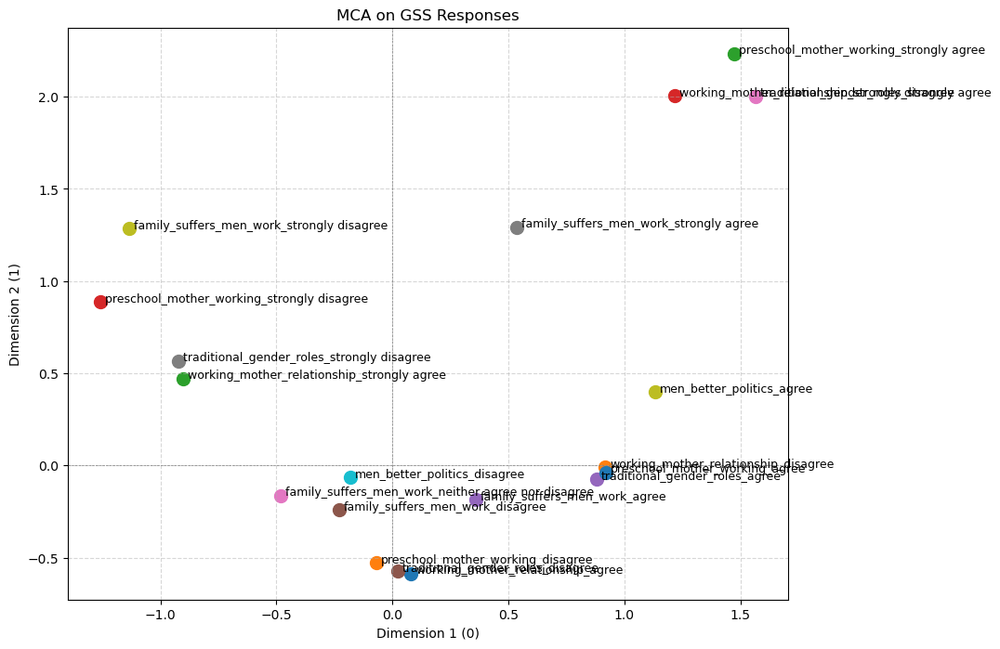

In [34]:
import matplotlib.pyplot as plt

features = ['working_mother_relationship',
            'traditional_gender_roles',
            'men_better_politics',
            'preschool_mother_working',
            'family_suffers_men_work']
df_ca = gss[features].dropna().copy()

mca = prince.MCA(
    n_components=2)
mca = mca.fit(df_ca)

col_coords = mca.column_coordinates(df_ca)

plt.figure(figsize=(10, 8))
for category, point in col_coords.iterrows():
    plt.scatter(point[0], point[1], s=100)
    plt.text(point[0]+0.02, point[1], category, fontsize=9)
plt.axhline(0, color='grey', linestyle='--', linewidth=0.5)
plt.axvline(0, color='grey', linestyle='--', linewidth=0.5)
plt.title("MCA on GSS Responses")
plt.xlabel("Dimension 1 (0)")
plt.ylabel("Dimension 2 (1)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

#### Part b
Display the latent features for every category in the observed features, sorted by the first latent feature. Describe in words what concept this feature is attempting to measure, and give the feature a name. [2 points]

In [29]:
col_coords = mca.column_coordinates(df_ca)

col_coords_sorted = col_coords.sort_values(0)
col_coords_sorted

,0,1
preschool_mother_working_strongly disagree,-1.258059,0.886695
family_suffers_men_work_strongly disagree,-1.135401,1.283823
traditional_gender_roles_strongly disagree,-0.922038,0.566822
working_mother_relationship_strongly agree,-0.901117,0.472174
family_suffers_men_work_neither agree nor disagree,-0.480746,-0.163826
family_suffers_men_work_disagree,-0.228692,-0.242575
men_better_politics_disagree,-0.180400,-0.063737
preschool_mother_working_disagree,-0.067884,-0.529265
traditional_gender_roles_disagree,0.022159,-0.572468
working_mother_relationship_agree,0.080483,-0.586391


This latent dimension appears to capture respondents’ orientation toward traditional gender roles versus more egalitarian views. In the lower (negative) scores, we see responses like “preschool_mother_working_strongly disagree” and “family_suffers_men_work_strongly disagree,” indicating rejection of conventional ideas—for instance, disagreement with the notion that children or family life necessarily suffer when mothers work. On the higher (positive) end, responses such as “traditional_gender_roles_strongly agree” and “preschool_mother_working_strongly agree” cluster together, suggesting an endorsement of more conventional, traditional roles. As the value on this latent dimension increases, so does the degree to which a respondent supports traditional gender role expectations. A suitable name for this feature is “Gender Role Conservatism” (`gender_role_conservatism`).

#### Part c
We can use the results of the MCA model to conduct some cool EDA. For one example, follow these steps:

1. Use the `.row_coordinates()` method to calculate values of the latent feature for every row in the data you passed to the MCA in part a. Extract the first column and store it in its own dataframe.

2. To join it with the full, cleaned GSS data based on row numbers (instead of on a primary key), use the `.join()` method. For example, if we named the cleaned GSS data `gss_clean` and if we named the dataframe in step 1 `latentfeature`, we can type
```
gss_clean = gss_clean.join(latentfeature, how="outer")
```
3. Create a cross-tabuation with age categories (that you constructed in problem 5) in the rows and sex in the columns. Instead of a frequency, place the mean value of the latent feature in the cells. 

What does this table tell you about the relationship between sex, age, and the latent feature? [2 points]

In [33]:
row_coords = mca.row_coordinates(df_ca)

latent_feature = row_coords.iloc[:, [0]].copy()
latent_feature.columns = ['gender_role_conservatism']

gss = gss.join(latent_feature, how="outer")

age_sex_latent = pd.crosstab(
    gss['age_group'],
    gss['sex'],
    values=gss['gender_role_conservatism'],
    aggfunc='mean'
)

age_sex_latent

sex,female,male
age_group,,
18-35,-0.237379,-0.003774
36-49,-0.137001,-0.000686
50-69,-0.125059,0.222532
70+,0.129257,0.473006


The table indicates that traditional gender role attitudes, as measured by the latent feature, generally become more pronounced with increasing age, particularly among males. Younger respondents (both sexes) tend to lean towards more egalitarian views, but as age increases the tendency to endorse more traditional roles increases, with older males showing the strongest traditional perspective. In contrast, while females also display a shift toward more traditional views in the oldest group, the change is less dramatic. Overall, age appears to interact with sex such that older men exhibit the highest adherence to traditional gender roles compared to younger individuals and females across age groups.